# *Notebook d'essais des différentes approches de modélisation*

## Sommaire

<ol>
    <li><a href="#">Import des librairies</a></li>
    <li><a href="#">Chargement des données</a></li>
    <li><a href="#">Segmentation RFM</a></li>
        <ol>
            <li><a href="#">Formatage</a></li>
            <li><a href="#">Analyse</a></li>
            <li><a href="#">ACP</a></li>
        </ol>
    <li><a href="#">Approches de modélisation</a></li>
        <ol>
            <li><a href="#">Clustering hiérarchique</a></li>
            <li><a href="#">KMeans</a></li>
        </ol>
    <li><a href="#">Tableau récapitulatif</a></li>
    <li><a href="#">Conclusion</a></li>
</ol>

## Import des librairies

In [56]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt

import plotly.io as pio
pio.renderers.default='notebook'

from sklearn import preprocessing

from scipy.cluster.hierarchy import dendrogram, linkage

# Import des modules contenant les fonctions utilitaires
import src.data_helpers as dth

In [57]:
# Réglage des graphiques
plt.style.use('seaborn-whitegrid')

plt.rc('font', size=12)
plt.rc('axes', titlesize=20)
plt.rc('axes', labelsize=20)
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)
plt.rc('legend', fontsize=12)

dims_fig = (25,20)

## Chargement des données

On recupère le jeu de données sauvegardé à la fin de l'analyse et de la manipulation des données

In [58]:
orders_merge = pd.read_csv('merge.csv', sep=',')

## Segmentation RFM

La segmentation RFM (Récence, Fréquence, Montant) est une méthode très utilisée en marketing, qui consiste à établir des segments de clients homogènes.

Nous allons regrouper les données du fichier par client unique, et créer 3 variables pour chaque client :
- Recence : Date du dernier achat
- Frequence : Nombre de commandes 
- Montant cumulé : Montant total de toutes les commandes

In [59]:
rfm = orders_merge.groupby('customer_unique_id').agg(
    recence = ("order_purchase_timestamp", "max"),
    frequence = ("customer_id", "count"),
    montant_cumulé = ("payment_value", "sum")
)

In [60]:
rfm.head()

,recence,frequence,montant_cumulé
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,1,141.90
0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,1,27.19
0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,1,86.22
0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,1,43.62
0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,1,196.89


In [61]:
rfm.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96096 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   recence         96096 non-null  object 
 1   frequence       96096 non-null  int64  
 2   montant_cumulé  96096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 2.9+ MB


### Formatage

On va formater la date de la feature recence pour obtenir la date du dernier achat en nombre de jours. On se base sur la date la plus proche que l'on fixe à 1.

In [62]:
date_format = '%Y-%m-%d %H:%M:%S'
max_date = datetime.strptime(rfm['recence'].max(), date_format)
rfm['recence'] = rfm['recence'].transform(lambda x: (max_date - datetime.strptime(x, date_format)).days)
rfm

,recence,frequence,montant_cumulé
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,160,1,141.90
0000b849f77a49e4a4ce2b2a4ca5be3f,163,1,27.19
0000f46a3911fa3c0805444483337064,585,1,86.22
0000f6ccb0745a6a4b88665a16c9f078,369,1,43.62
0004aac84e0df4da2b147fca70cf8255,336,1,196.89
...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,495,1,2067.42
fffea47cd6d3cc0a88bd621562a9d061,310,1,84.58
ffff371b4d645b6ecea244b27531430a,617,1,112.46


### Analyse

In [63]:
rfm[rfm['frequence'] > 1].count()*100 / rfm.shape[0]

recence           3.118756
frequence         3.118756
montant_cumulé    3.118756
dtype: float64

On observe qu'il n'y a que 3,11% des clients qui ont commandé plus d'une fois.

On va ensuite observer la distribution de ces variables RFM.

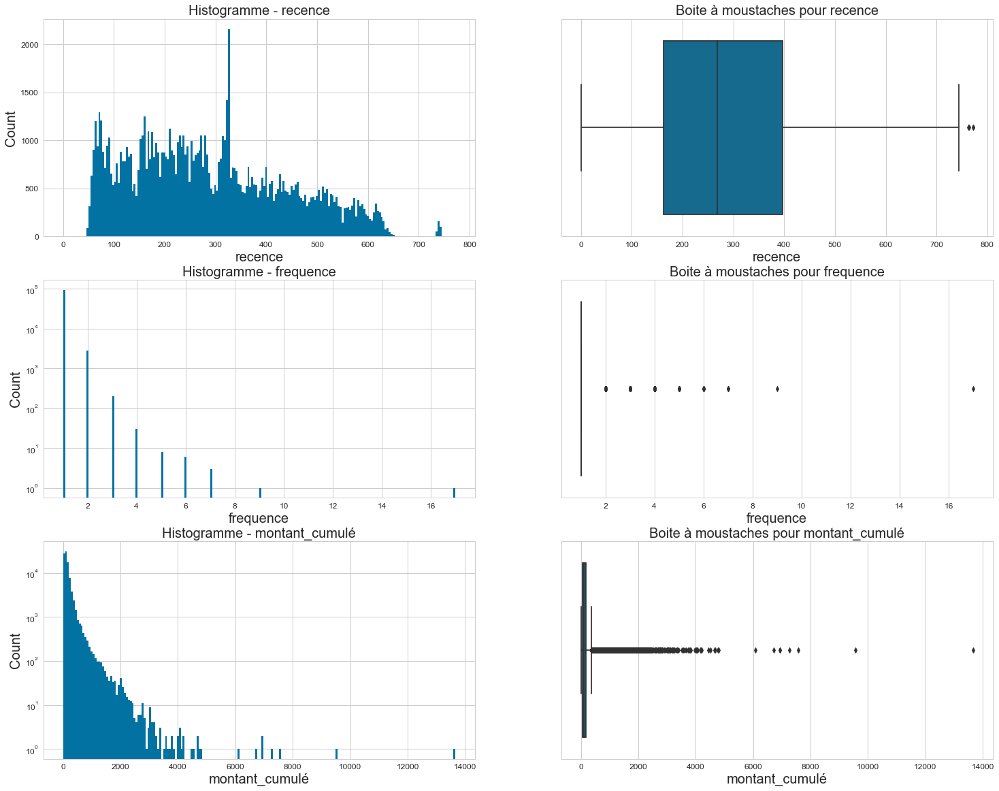

In [64]:
dth.drawHistAndBoxPlot(rfm, rfm.columns, dims_fig)

Il n'y a pas de valeurs aberrantes, ni de valeurs manquantes. On peut garder les données telle quelle pour la suite.

### ACP

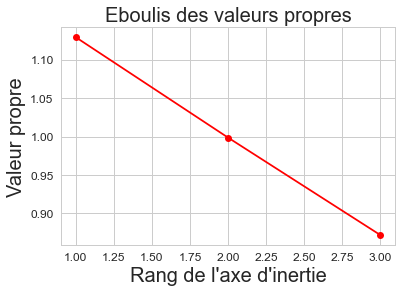

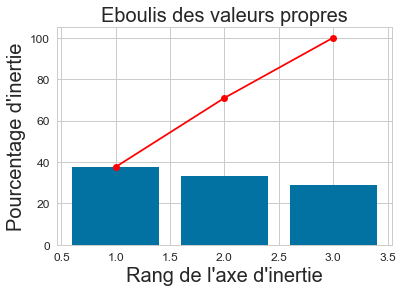

Le nombre de composantes à analyser est de 2


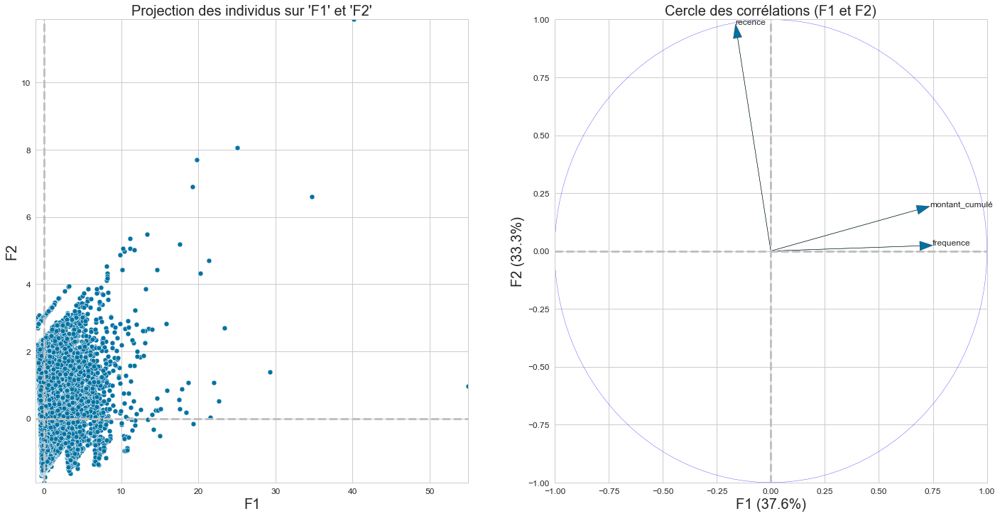

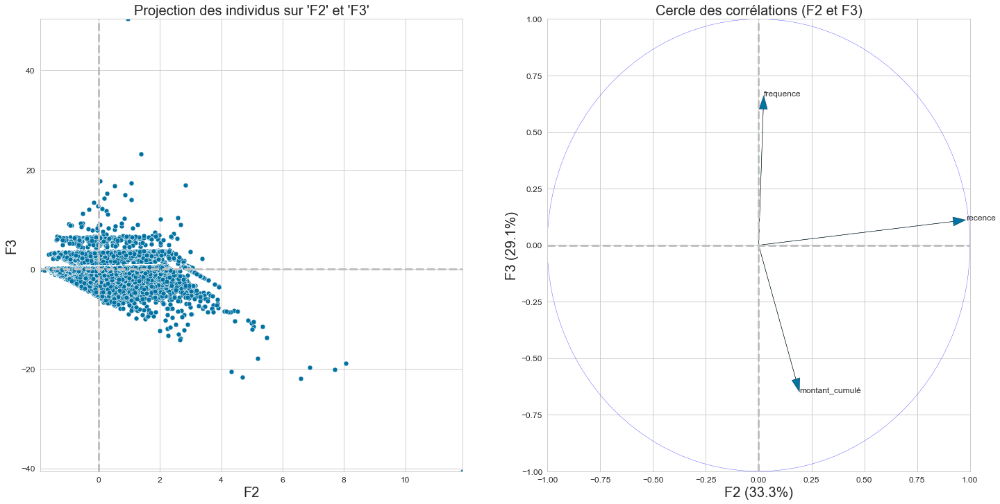

In [65]:
dth.acpAnalysis(rfm)

l'ACP n'est pas très pertinente sur ces features, elle permet simplement d'observer une orthogonalité entre elles sur le cercle des corrélations.

## Approches de modélisation

Nous allons utiliser plusieurs modèles pour segmenter nos clients et trouver celui qui est le plus performant.

### Clustering hiérarchique

On utilise un Dendogram pour visualiser la hiérarchie des variables RFM.

{'icoord': [[5.0, 5.0, 15.0, 15.0],
  [25.0, 25.0, 35.0, 35.0],
  [10.0, 10.0, 30.0, 30.0],
  [45.0, 45.0, 55.0, 55.0],
  [65.0, 65.0, 75.0, 75.0],
  [50.0, 50.0, 70.0, 70.0],
  [20.0, 20.0, 60.0, 60.0]],
 'dcoord': [[0.0, 46.66706943762307, 46.66706943762307, 0.0],
  [0.0, 90.1273993290372, 90.1273993290372, 0.0],
  [46.66706943762307, 99.08418367158265, 99.08418367158265, 90.1273993290372],
  [0.0, 117.19715698065853, 117.19715698065853, 0.0],
  [0.0, 198.8708561039888, 198.8708561039888, 0.0],
  [117.19715698065853,
   240.5799967606504,
   240.5799967606504,
   198.8708561039888],
  [99.08418367158265,
   285.3360342375102,
   285.3360342375102,
   240.5799967606504]],
 'ivl': ['(47)',
  '(1360)',
  '17036',
  '(123)',
  '(6556)',
  '(14851)',
  '(20896)',
  '(4214)'],
 'leaves': [96045, 96076, 17036, 96080, 96073, 96083, 96085, 96091],
 'color_list': ['C1', 'C1', 'C1', 'C2', 'C3', 'C0', 'C0'],
 'leaves_color_list': ['C1', 'C1', 'C1', 'C1', 'C2', 'C2', 'C3', 'C3']}

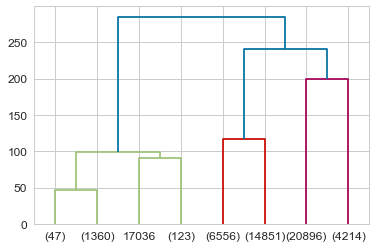

In [66]:
# Standardisation des données
std_scale = preprocessing.StandardScaler().fit(rfm)
rfm_std = pd.DataFrame(
    std_scale.transform(rfm),
    columns=rfm.columns
)

dendrogram(
    linkage(rfm_std.sample(frac=0.5, random_state=42), method="ward"),
    truncate_mode="level",
    p=2,
)

Le graphe nous affiche une possibilité avec 4 clusters, mais il est possible de segmenter en plus de clusters.

### Méthode des kMeans

Le modèle des kMeans est un des plus simples à utiliser, il prend en entrée un nombre de clusters et le data à segmenter.

On va modéliser plusieurs fois en rajoutant des features en plus des features RFM, afin de tester leur impact sur le modèle, et observer ou non une dégradation de celui ci.

Pour déterminer le nombre de clusters (la valeur optimale de k), on va utiliser la méthode du coude (valeurs de la distorsion de l'inertie) et le score silhouette (moyenne des coefficients de silhouette pour chacun des points)

Les différenets étapes pour chaque modélisation :
- Standardisation des données
- Méthode du coude
- Score silhouette
- Entraînement du modèle et prédiction
- Histogramme du nbr de clients par cluster
- Distribution des features pour chaque cluster
- Radar Chart
- TSNE

In [67]:
results = []

#### Features RFM

Modèle avec les 3 features RFM (Récence, Fréquence, Montant cumulé)

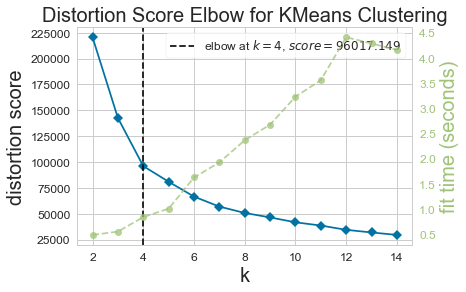

Le nombre optimal de clusters est 4


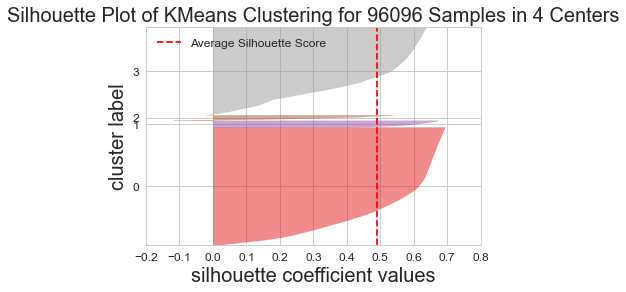

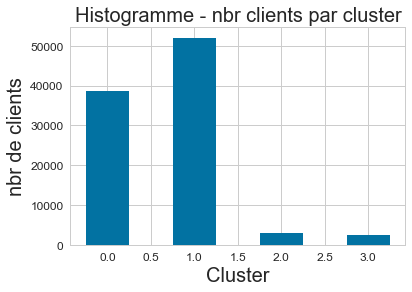

Cluster 0: 38640 clients | 40.21% du total
Cluster 1: 52038 clients | 54.15% du total
Cluster 2: 2962 clients | 3.08% du total
Cluster 3: 2456 clients | 2.56% du total


C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



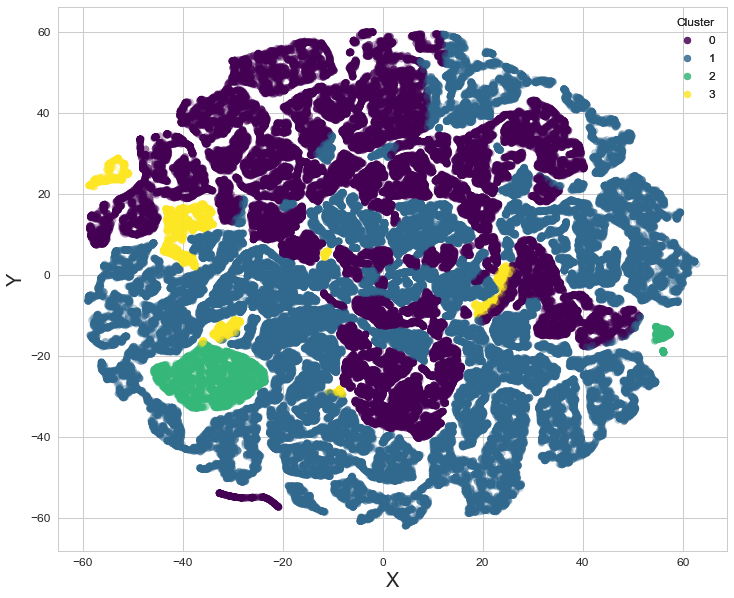

In [68]:
result_rfm = dth.modelCluster(rfm.copy())
results.append(result_rfm)

#### Features RFM + review_score

On va ici rajouter la feature 'review_score' en plus des features RFM

Pour le review_score on supprime les lignes qui n'en ont pas, après vérification, cela concerne toutes sortes de clients, il n'y aura donc pas d'impact sur un cluster spécifique.
Il vaut mieux les supprimer plutôt que d'imputer ces valeurs manquantes car cela fausserait le jeu de données.

In [69]:
review_score = orders_merge.groupby('customer_unique_id').agg(
    review_score = ("review_score", "mean")
)

rfm['review_score'] = review_score['review_score'].values

# On supprime les lignes sans review_score
index = rfm.index[rfm['review_score'].isnull()]
rfm = rfm.drop(index=index)
rfm

,recence,frequence,montant_cumulé,review_score
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,160,1,141.90,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,163,1,27.19,4.0
0000f46a3911fa3c0805444483337064,585,1,86.22,3.0
0000f6ccb0745a6a4b88665a16c9f078,369,1,43.62,4.0
0004aac84e0df4da2b147fca70cf8255,336,1,196.89,5.0
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,495,1,2067.42,5.0
fffea47cd6d3cc0a88bd621562a9d061,310,1,84.58,4.0
ffff371b4d645b6ecea244b27531430a,617,1,112.46,5.0


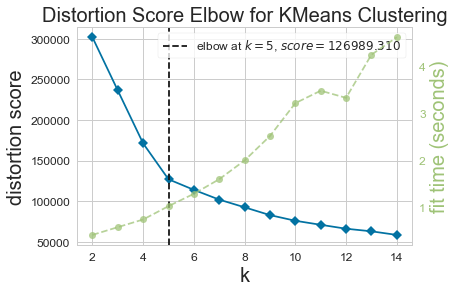

Le nombre optimal de clusters est 5


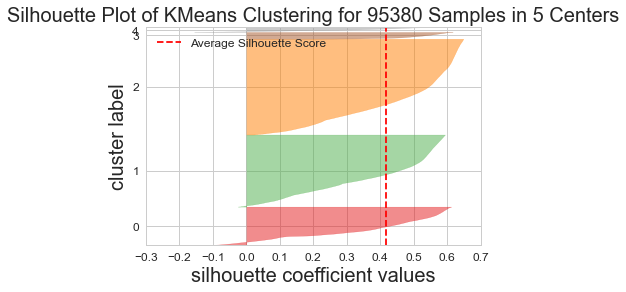

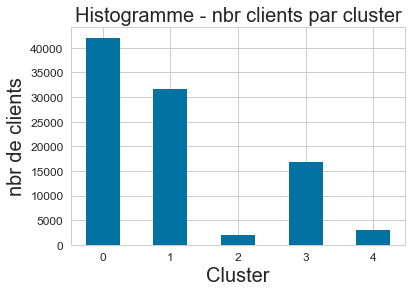

Cluster 0: 42052 clients | 44.09% du total
Cluster 1: 31619 clients | 33.15% du total
Cluster 2: 2003 clients | 2.1% du total
Cluster 3: 16753 clients | 17.56% du total
Cluster 4: 2953 clients | 3.1% du total


C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



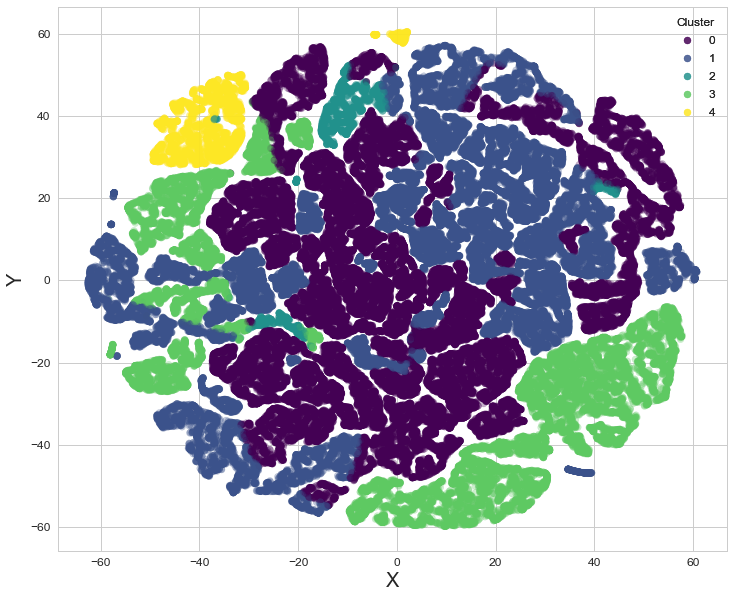

In [70]:
result_rfm = dth.modelCluster(rfm.copy())
results.append(result_rfm)

#### Features RFM + delivery_time

In [71]:
def calculDeliveryTime(row):
    date_format = '%Y-%m-%d %H:%M:%S'
    purchase_date_format = datetime.strptime(row['order_purchase_timestamp'], date_format)
    delivery_date_format = datetime.strptime(row['order_delivered_customer_date'], date_format)
    return (delivery_date_format - purchase_date_format).days

In [72]:
def calculEstimatedTime(row):
    date_format = '%Y-%m-%d %H:%M:%S'
    purchase_date_format = datetime.strptime(row['order_purchase_timestamp'], date_format)
    estimated_date_format = datetime.strptime(row['order_estimated_delivery_date'], date_format)
    return (estimated_date_format - purchase_date_format).days

In [73]:
def calculDifferenceTime(row):
    return row['estimated_time'] - row['delivery_time']

In [74]:
index = orders_merge.index[orders_merge['order_delivered_customer_date'].isnull()]
orders_merge = orders_merge.drop(index=index)

In [75]:
orders_merge['delivery_time'] = orders_merge.apply(lambda row: calculDeliveryTime(row), axis=1)
orders_merge['estimated_time'] = orders_merge.apply(lambda row: calculEstimatedTime(row), axis=1)
orders_merge['difference_time'] = orders_merge.apply(lambda row: calculDifferenceTime(row), axis=1)

In [76]:
rfm = orders_merge.groupby('customer_unique_id').agg(
    recence = ("order_purchase_timestamp", "max"),
    frequence = ("customer_id", "count"),
    montant_cumulé = ("payment_value", "sum"),
    delivery_time = ("delivery_time", "mean"),
    estimated_time = ("estimated_time", "mean"),
    difference_time = ("difference_time", "mean")
)

In [77]:
date_format = '%Y-%m-%d %H:%M:%S'
max_date = datetime.strptime(rfm['recence'].max(), date_format)
rfm['recence'] = rfm['recence'].transform(lambda x: (max_date - datetime.strptime(x, date_format)).days)

In [78]:
rfm_delivery = rfm[['recence', 'frequence', 'montant_cumulé', 'delivery_time']]
rfm_delivery

,recence,frequence,montant_cumulé,delivery_time
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,6.0
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,3.0
0000f46a3911fa3c0805444483337064,536,1,86.22,25.0
0000f6ccb0745a6a4b88665a16c9f078,320,1,43.62,20.0
0004aac84e0df4da2b147fca70cf8255,287,1,196.89,13.0
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,446,1,2067.42,27.0
fffea47cd6d3cc0a88bd621562a9d061,261,1,84.58,30.0
ffff371b4d645b6ecea244b27531430a,567,1,112.46,14.0


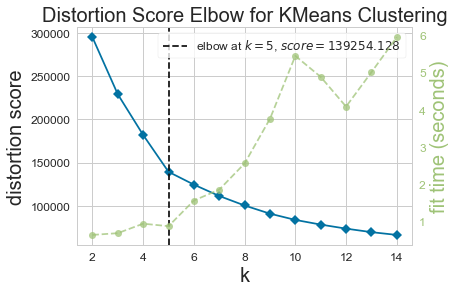

Le nombre optimal de clusters est 5


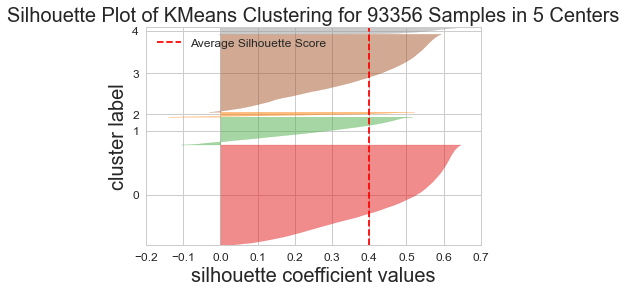

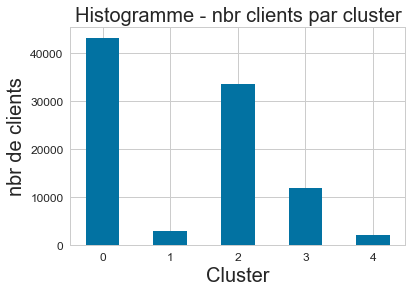

Cluster 0: 43121 clients | 46.19% du total
Cluster 1: 2772 clients | 2.97% du total
Cluster 2: 33456 clients | 35.84% du total
Cluster 3: 11882 clients | 12.73% du total
Cluster 4: 2125 clients | 2.28% du total


C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



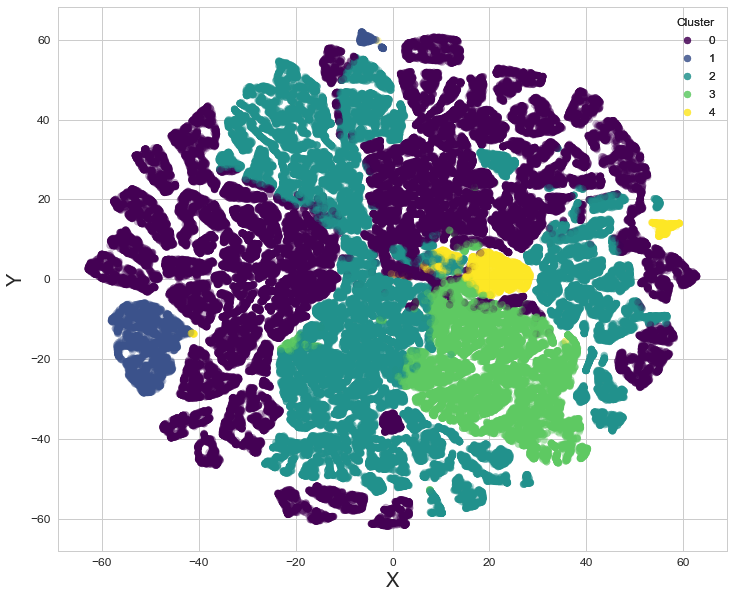

In [79]:
result_rfm = dth.modelCluster(rfm_delivery.copy())
results.append(result_rfm)

#### Features RFM + estimated_delivery_time

In [80]:
rfm_estimated_delivery = rfm[['recence', 'frequence', 'montant_cumulé', 'estimated_time']]
rfm_estimated_delivery

,recence,frequence,montant_cumulé,estimated_time
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,10.0
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,7.0
0000f46a3911fa3c0805444483337064,536,1,86.22,27.0
0000f6ccb0745a6a4b88665a16c9f078,320,1,43.62,31.0
0004aac84e0df4da2b147fca70cf8255,287,1,196.89,20.0
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,446,1,2067.42,54.0
fffea47cd6d3cc0a88bd621562a9d061,261,1,84.58,32.0
ffff371b4d645b6ecea244b27531430a,567,1,112.46,44.0


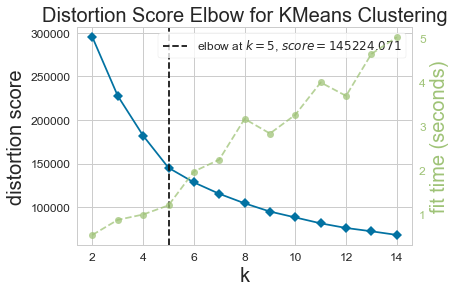

Le nombre optimal de clusters est 5


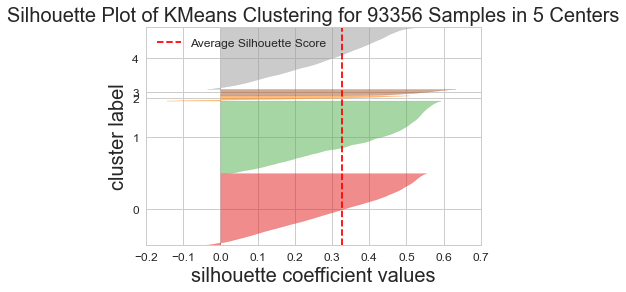

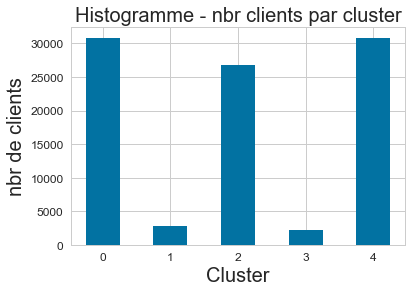

Cluster 0: 30861 clients | 33.06% du total
Cluster 1: 2772 clients | 2.97% du total
Cluster 2: 26777 clients | 28.68% du total
Cluster 3: 2192 clients | 2.35% du total
Cluster 4: 30754 clients | 32.94% du total


C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



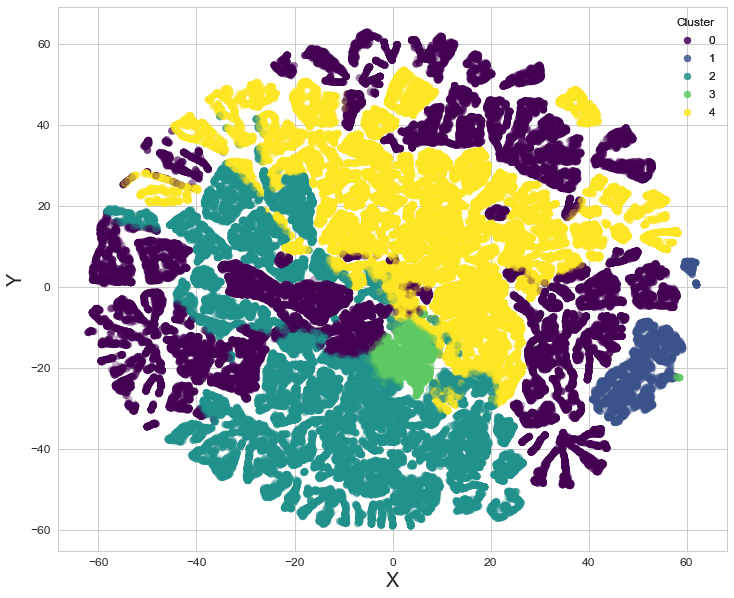

In [81]:
result_rfm = dth.modelCluster(rfm_estimated_delivery.copy())
results.append(result_rfm)

#### Features RFM + difference between delivery_time and estimated_delivery_time

In [82]:
rfm_difference_delivery = rfm[['recence', 'frequence', 'montant_cumulé', 'difference_time']]
rfm_difference_delivery

,recence,frequence,montant_cumulé,difference_time
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,4.0
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,4.0
0000f46a3911fa3c0805444483337064,536,1,86.22,2.0
0000f6ccb0745a6a4b88665a16c9f078,320,1,43.62,11.0
0004aac84e0df4da2b147fca70cf8255,287,1,196.89,7.0
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,446,1,2067.42,27.0
fffea47cd6d3cc0a88bd621562a9d061,261,1,84.58,2.0
ffff371b4d645b6ecea244b27531430a,567,1,112.46,30.0


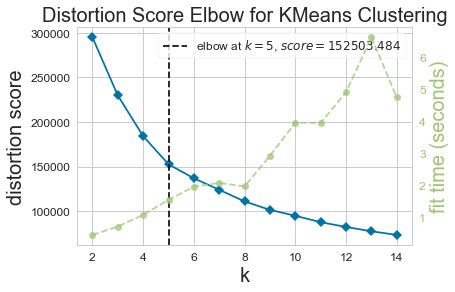

Le nombre optimal de clusters est 5


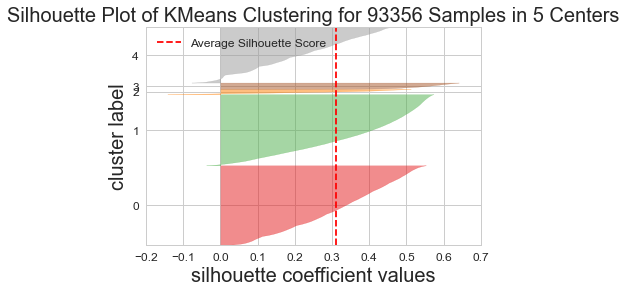

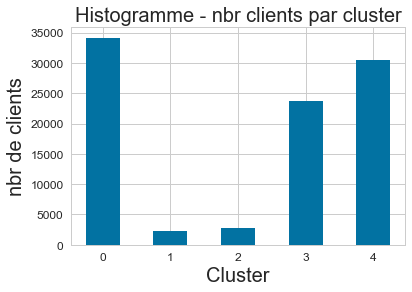

Cluster 0: 34145 clients | 36.58% du total
Cluster 1: 2218 clients | 2.38% du total
Cluster 2: 2772 clients | 2.97% du total
Cluster 3: 23696 clients | 25.38% du total
Cluster 4: 30525 clients | 32.7% du total


C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



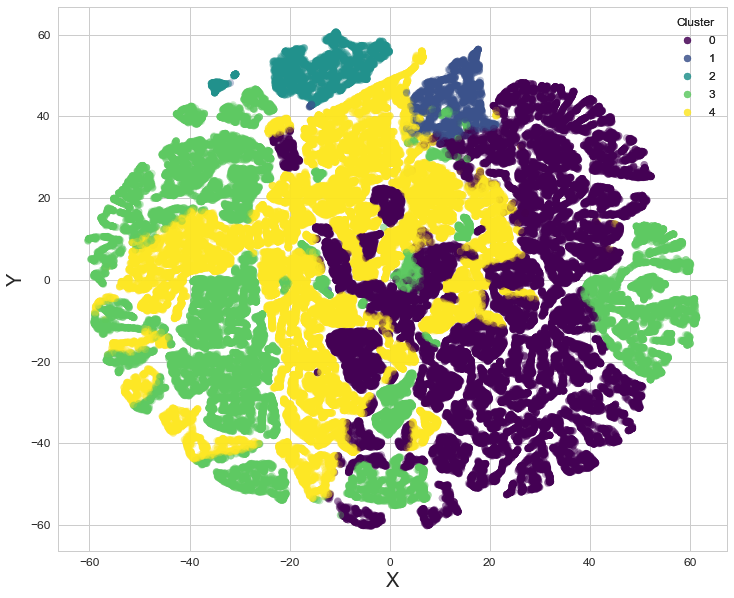

In [83]:
result_rfm = dth.modelCluster(rfm_difference_delivery.copy())
results.append(result_rfm)

### Features RFM + (customer state = seller state ?)

In [84]:
def determineStateDifference(row):
    return 1 if row['customer_state'] == row['seller_state'] else 0

In [85]:
orders_merge['seller_same_state'] = orders_merge.apply(lambda row: determineStateDifference(row), axis=1)

In [86]:
rfm = orders_merge.groupby('customer_unique_id').agg(
    recence = ("order_purchase_timestamp", "max"),
    frequence = ("customer_id", "count"),
    montant_cumulé = ("payment_value", "sum"),
    seller_same_state = ("seller_same_state", "first"),
    payment_type = ("payment_type", "first")
)

In [87]:
date_format = '%Y-%m-%d %H:%M:%S'
max_date = datetime.strptime(rfm['recence'].max(), date_format)
rfm['recence'] = rfm['recence'].transform(lambda x: (max_date - datetime.strptime(x, date_format)).days)

In [88]:
rfm_state = rfm[['recence', 'frequence', 'montant_cumulé', 'seller_same_state']]
rfm_state

,recence,frequence,montant_cumulé,seller_same_state
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,1
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,1
0000f46a3911fa3c0805444483337064,536,1,86.22,0
0000f6ccb0745a6a4b88665a16c9f078,320,1,43.62,0
0004aac84e0df4da2b147fca70cf8255,287,1,196.89,1
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,446,1,2067.42,0
fffea47cd6d3cc0a88bd621562a9d061,261,1,84.58,0
ffff371b4d645b6ecea244b27531430a,567,1,112.46,0


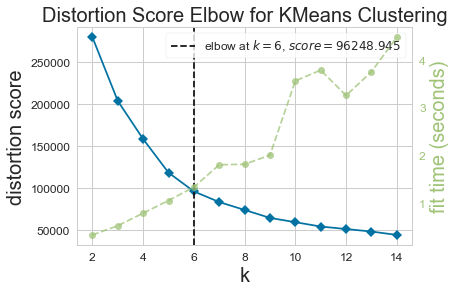

Le nombre optimal de clusters est 6


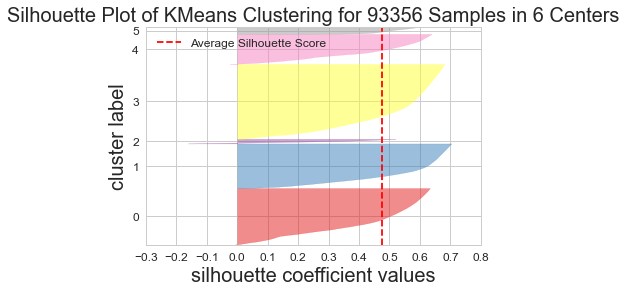

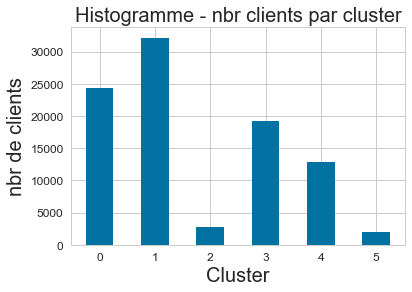

Cluster 0: 24370 clients | 26.1% du total
Cluster 1: 32149 clients | 34.44% du total
Cluster 2: 2772 clients | 2.97% du total
Cluster 3: 19155 clients | 20.52% du total
Cluster 4: 12910 clients | 13.83% du total
Cluster 5: 2000 clients | 2.14% du total


C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



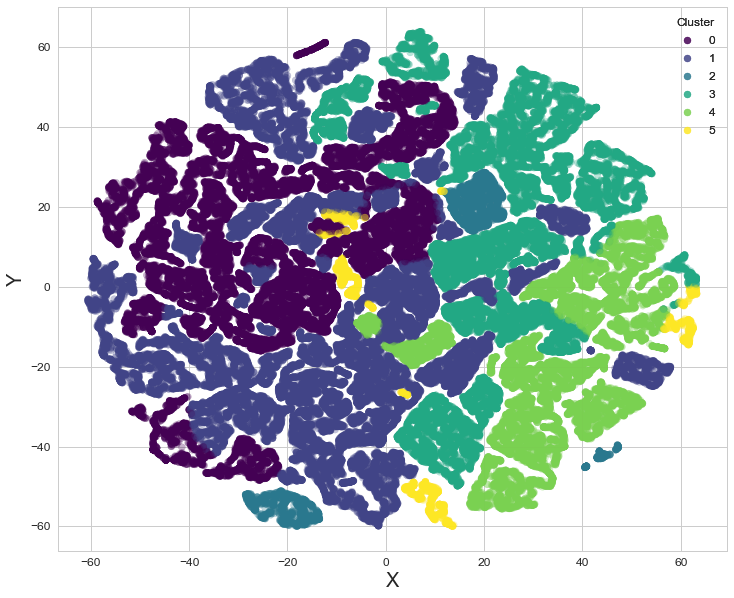

In [89]:
result_rfm = dth.modelCluster(rfm_state.copy())
results.append(result_rfm)

### Features RFM + payment_type

In [90]:
rfm_payment = rfm[['recence', 'frequence', 'montant_cumulé', 'payment_type']]
rfm_payment

,recence,frequence,montant_cumulé,payment_type
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,credit_card
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,credit_card
0000f46a3911fa3c0805444483337064,536,1,86.22,credit_card
0000f6ccb0745a6a4b88665a16c9f078,320,1,43.62,credit_card
0004aac84e0df4da2b147fca70cf8255,287,1,196.89,credit_card
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,446,1,2067.42,credit_card
fffea47cd6d3cc0a88bd621562a9d061,261,1,84.58,credit_card
ffff371b4d645b6ecea244b27531430a,567,1,112.46,credit_card


In [91]:
le = preprocessing.LabelEncoder()
le.fit(rfm_payment['payment_type'])
rfm_payment['payment_type'] = le.transform(rfm_payment['payment_type'])
rfm_payment

C:\Users\romai\AppData\Local\Temp\ipykernel_16232\3473312898.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,recence,frequence,montant_cumulé,payment_type
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,1
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,1
0000f46a3911fa3c0805444483337064,536,1,86.22,1
0000f6ccb0745a6a4b88665a16c9f078,320,1,43.62,1
0004aac84e0df4da2b147fca70cf8255,287,1,196.89,1
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,446,1,2067.42,1
fffea47cd6d3cc0a88bd621562a9d061,261,1,84.58,1
ffff371b4d645b6ecea244b27531430a,567,1,112.46,1


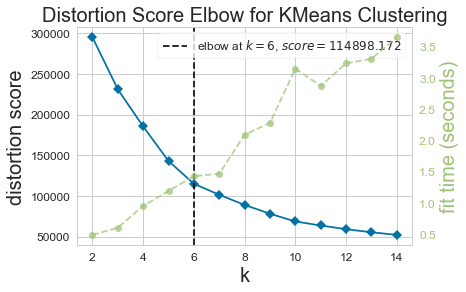

Le nombre optimal de clusters est 6


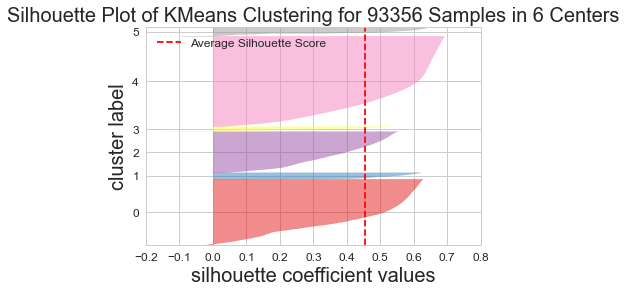

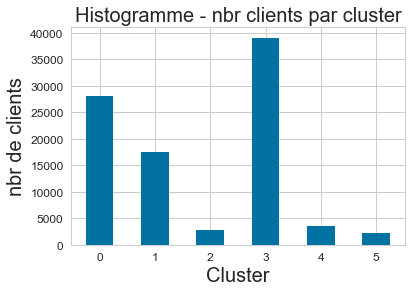

Cluster 0: 28121 clients | 30.12% du total
Cluster 1: 17552 clients | 18.8% du total
Cluster 2: 2772 clients | 2.97% du total
Cluster 3: 39114 clients | 41.9% du total
Cluster 4: 3605 clients | 3.86% du total
Cluster 5: 2192 clients | 2.35% du total


C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



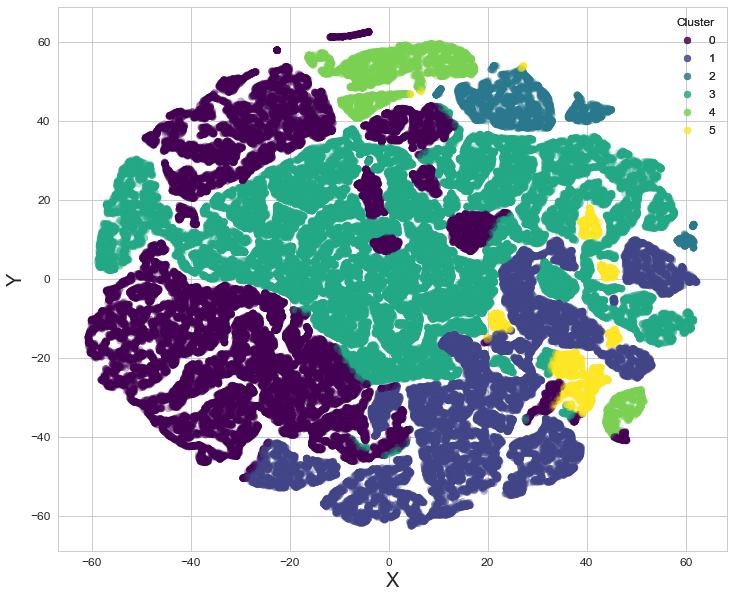

In [92]:
result_rfm = dth.modelCluster(rfm_payment.copy())
results.append(result_rfm)

## Tableau récapitulatif

In [93]:
pd.DataFrame(results)

,Features,Nbr clusters,Score silhouette
0,"[recence, frequence, montant_cumulé, labels]",4,0.488603
1,"[recence, frequence, montant_cumulé, review_sc...",5,0.418118
2,"[recence, frequence, montant_cumulé, delivery_...",5,0.399637
3,"[recence, frequence, montant_cumulé, estimated...",5,0.327901
4,"[recence, frequence, montant_cumulé, differenc...",5,0.309981
5,"[recence, frequence, montant_cumulé, seller_sa...",6,0.476610
6,"[recence, frequence, montant_cumulé, payment_t...",6,0.453014


## Conclusion

Le modèle kMeans segmente notre jeu de données en 4 ou 5 clusters, dépendamment des features que l'on sélectionne.

Mais il y a toujours 2 clusters principaux qui ressortent, ce sont les clients qui achètent fréquemment, et ceux qui dépensent de gros montants.
Ils représentent une minorité des clients, en effet seulement 3,11% d'entre eux reviennent acheter sur le site, et ces 3.11% sont classés parmi ces 2 clusters.

Les clients qui n'ont passé qu'une seule commande sont ceux placés dans les autres clusters.

Ces autres clusters segmentent principalement les clients en fonction de la récence, du groupe de clients ayant passé commande le plus récemment au groupe de clients ayant passé commande il y a longtemps.

Ajouter d'autres features dans notre modèle va simplement affiner la segmentation de nos clients n'ayant commandé qu'une seule fois.
Le score silhouette peut être dégradé ou amélioré en ajoutant des features, mais globalement on obtient toujours la même segmentation pour les clients les plus importants.

Ajouter des features est donc intéressant si l'on veut identifier un moyen de fidéliser les clients qui n'achètent qu'une seule fois, en affinant leur segmentation en fonction du review score, de la méthode de paiement ou encore du pays du client.

Pour les clients les plus importants les données les plus intéressantes sont la fréquence d'achat et le montant cumulé, les autres features ne vont pas améliorer ces clusters.